# Breast Cancer Diagnosis Logistic Regression - Machine Learning

In this project, I will explore and analyze a Kaggle dataset containing data on breast cancer diagnostics in Wisconsin. I will preprocess this data, create training and test sets, train a logistic regression model, and evaluate the accuracy of this model using validation and testing sets to predict whether cancer is benign or malignant.

Original dataset can be found here: [Dataset](https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data/data)

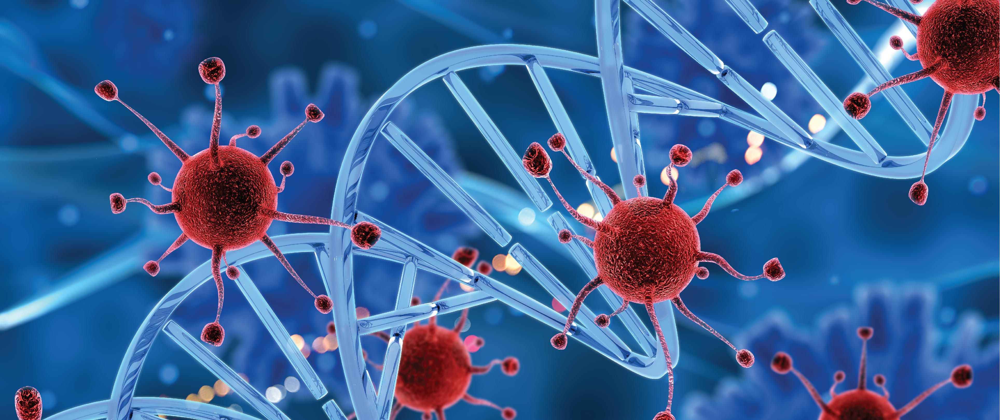

## Notebook Content

1. Downloading the data
2. Data cleaning
3. Exploratory data analysis/visualization
4. Data preprocessing for the logistic regression model
5. Model training
6. Evaluation of the model
7. Conclusion

## Downloading the data

We should first import all the necessary libraries for this project, then read in the csv file to this notebook.

In [2]:
# Import data analysis libraries
import pandas as pd
import numpy as np

# Import visualization libraries
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Create chart parameters
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

# Import machine learning libraries
from sklearn.model_selection import train_test_split # Allows us to split the data into training/test sets
from sklearn.impute import SimpleImputer # Imputes null numeric values with a selected value
from sklearn.preprocessing import MinMaxScaler # Creates a scaler for numeric values (0,1)
from sklearn.linear_model import LogisticRegression # Using LogisticRegression model
from sklearn.metrics import accuracy_score # Computes accuracy of model
from sklearn.metrics import confusion_matrix # Creates confusion matrix for predictions
import joblib # Saves and loads training models

Now we can read the csv file into our notebook.

In [3]:
# Import dataset
raw_df = pd.read_csv(r"C:\Users\khang\Downloads\data.csv")

## Data cleaning

During the cleaning process, we should check data types, locate null values, and make sure our data is preprocessed for the later analyses and training.

In [4]:
raw_df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


The dataset contains 596 rows and 33 columns worth of data. The dataset contains an id, numerical columns, and a few categorical columns. We want to predict the value in the **diagnosis** column.

Let's check the data types and missing values for various columns.

In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Almost every column is a numerical column which we can use for our inputs when training the model. Luckily, the data seems relatively clean with no missing values in almost every columns, besides the **Unnamed: 32** column.

We should glance at the **Unnamed: 32** column now.

In [7]:
raw_df['Unnamed: 32']

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
564   NaN
565   NaN
566   NaN
567   NaN
568   NaN
Name: Unnamed: 32, Length: 569, dtype: float64

Since every value in this column is null, we are better off removing the column.

In [8]:
raw_df.drop(columns='Unnamed: 32', inplace=True)

In [9]:
raw_df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


We should remove all columns that include the keyword **worst** since this column identifies the highest value within that given column, and could potentially skew our data by a large margin.

In [95]:
# Drop columns associated with "worst" attributes
worst_cols = ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 
              'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 
              'fractal_dimension_worst']

raw_df = raw_df.drop(worst_cols, axis=1)

The columns are removed, we can now move onto the EDA and visualization portion!

## Exploratory data analysis/visualization

Before training the Logistic Regression model, we should uncover the trends in various columns and see how they are related to the target column (diagnosis). Let's explore and visualize the data using the Plotly, Matplotlib, and Seaborn libraries.

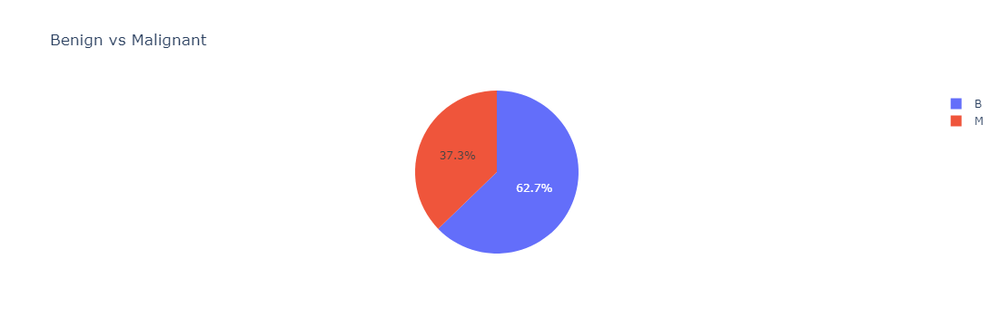

In [151]:
# Create a data frame of counts of diagnoses
diagnoses_df = raw_df['diagnosis'].value_counts()

# Pie chart showing counts of benign and malignant diagnoses
fig = px.pie(
    diagnoses_df,
    values=diagnoses_df.values,
    names=diagnoses_df.index,
    title='Benign vs Malignant',
    color=diagnoses_df.index,
)

fig.show();

We can see that 37.3% (212) of cases are cancerous, while 62.7% (357) of cases are benign.

We should take a look at any values that have strong correlations to the diagnosis now. I predict that the radius, perimeter, area, compactness and concavity will have high correlations to the final diagnosis.

In [97]:
raw_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115


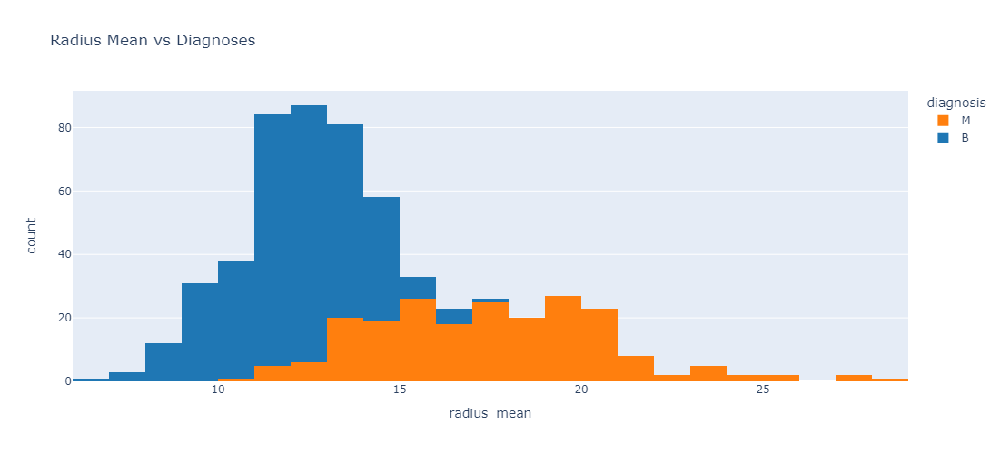

In [152]:
# Histogram of radius mean compared to diagnoses
fig = px.histogram(
    raw_df,
    x='radius_mean',
    title='Radius Mean vs Diagnoses',
    color='diagnosis',  # Use 'diagnosis' directly as the color argument
    color_discrete_map={'M': '#ff7f0e', 'B': '#1f77b4'},  # Specify colors for each category
    height=500
)

fig.show()

Through this histogram, it seems as if benign tumors have a lower radius mean compared to malignant tumors. Adding to the assumption that tumor radius determines the diagnosis.

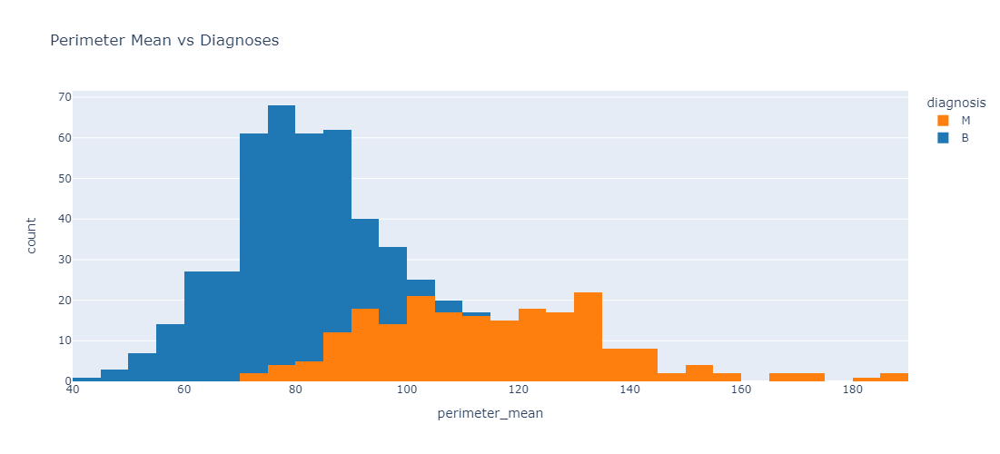

In [153]:
# Histogram of perimeter mean compared to diagnoses
fig = px.histogram(
    raw_df,
    x='perimeter_mean',
    title='Perimeter Mean vs Diagnoses',
    color='diagnosis',  # Use 'diagnosis' directly as the color argument
    color_discrete_map={'M': '#ff7f0e', 'B': '#1f77b4'},  # Specify colors for each category
    height=500
)

fig.show()

We pretty much have the same distribution as the radius mean histogram, showing that benign tumors have lower perimeters on average compared to malignant ones.

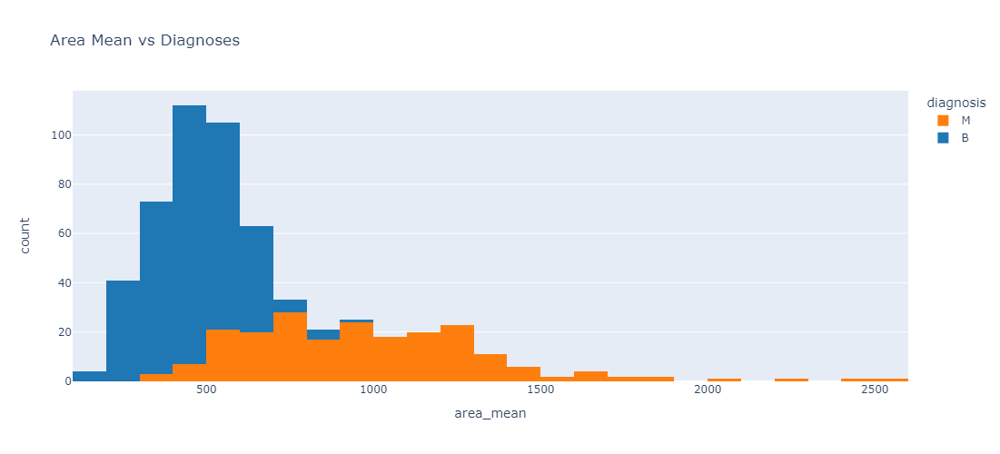

In [154]:
# Histogram of area mean compared to diagnoses
fig = px.histogram(
    raw_df,
    x='area_mean',
    title='Area Mean vs Diagnoses',
    color='diagnosis',  # Use 'diagnosis' directly as the color argument
    color_discrete_map={'M': '#ff7f0e', 'B': '#1f77b4'},  # Specify colors for each category
    height=500
)

fig.show()

As we see in the radius, and perimeter means, the lower the area mean is the more likely the tumor is to be benign.

We should make a scatterplot finding the correlation between compactness and concavity to see their relationship with the diagnosis.

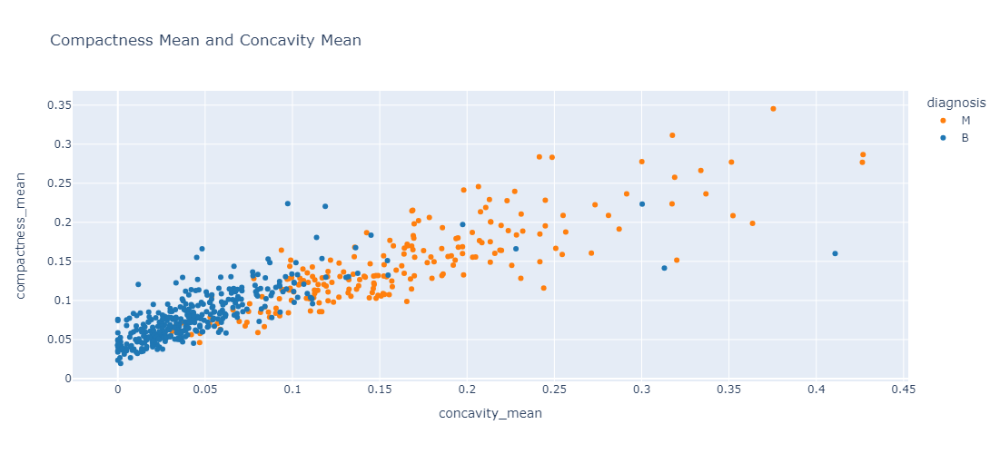

In [155]:
# Scatterplot of compactness and concavity
px.scatter(raw_df, 
           title='Compactness Mean and Concavity Mean ',
           x='concavity_mean', 
           y='compactness_mean', 
           color='diagnosis',
           color_discrete_map={'M': '#ff7f0e', 'B': '#1f77b4'},
           height=500)

There is a large cluster of benign tumors around the lower compactness and concavities. The higher the compactness and concavity is, the more often there seem to be malignant tumors. Through this scatterplot, we can determine that both compactness and concavity contribute in some way to the diagnosis.

## Data preprocessing for the logistic regression model

For the preprocessing of this data, we should divide the data into two sets:

1. **Training set** - Used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.
2. **Validation set** - Used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model.
3. **Testing set** - Used to compare different models or approaches and report the model's final accuracy.

We will split up the data into 60% for training, 20% for validation, and 20% for testing.

In [156]:
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [157]:
train_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
217,8811779,B,10.200,17.48,65.05,321.2,0.08054,0.05907,0.05774,0.01071,...,0.3567,1.9220,2.747,22.79,0.004680,0.03120,0.05774,0.010710,0.02560,0.004613
283,8912280,M,16.240,18.77,108.80,805.1,0.10660,0.18020,0.19480,0.09052,...,0.2873,0.9173,2.464,28.09,0.004563,0.03481,0.03872,0.012090,0.01388,0.004081
0,842302,M,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.015870,0.03003,0.006193
504,915186,B,9.268,12.87,61.49,248.7,0.16340,0.22390,0.09730,0.05252,...,0.4076,1.0930,3.014,20.04,0.009783,0.04542,0.03483,0.021880,0.02542,0.010450
251,88518501,B,11.500,18.45,73.28,407.4,0.09345,0.05991,0.02638,0.02069,...,0.3927,0.8429,2.684,26.99,0.006380,0.01065,0.01245,0.009175,0.02292,0.001461


In [104]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (341, 22)
val_df.shape : (114, 22)
test_df.shape : (114, 22)


After creating our training, validation, and testing sets, we can now properly identify inputs and targets. Looking at the data, we can ignore the id column because it won't be used for **prediction**, and we can ignore **diagnosis** since that is our target column.

We should identify the input columns and target column now.

In [105]:
input_cols = list(train_df.columns)[2:32]
target_col = 'diagnosis'

In [106]:
print(input_cols)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se']


In [107]:
target_col

'diagnosis'

We can now create inputs and targets for the training, validation and test sets for further processing and model training.

In [108]:
# Inputs and targets for training
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

# Inputs and targets for validation
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

# Inputs and targets for testing
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [109]:
train_inputs

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
217,10.200,17.48,65.05,321.2,0.08054,0.05907,0.05774,0.01071,0.1964,0.06315,0.3567,1.9220,2.747,22.79,0.004680,0.031200,0.057740,0.010710,0.02560,0.004613
283,16.240,18.77,108.80,805.1,0.10660,0.18020,0.19480,0.09052,0.1876,0.06684,0.2873,0.9173,2.464,28.09,0.004563,0.034810,0.038720,0.012090,0.01388,0.004081
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.049040,0.053730,0.015870,0.03003,0.006193
504,9.268,12.87,61.49,248.7,0.16340,0.22390,0.09730,0.05252,0.2378,0.09502,0.4076,1.0930,3.014,20.04,0.009783,0.045420,0.034830,0.021880,0.02542,0.010450
251,11.500,18.45,73.28,407.4,0.09345,0.05991,0.02638,0.02069,0.1834,0.05934,0.3927,0.8429,2.684,26.99,0.006380,0.010650,0.012450,0.009175,0.02292,0.001461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,14.710,21.59,95.55,656.9,0.11370,0.13650,0.12930,0.08123,0.2027,0.06758,0.4226,1.1500,2.735,40.09,0.003659,0.028550,0.025720,0.012720,0.01817,0.004108
492,18.010,20.56,118.40,1007.0,0.10010,0.12890,0.11700,0.07762,0.2116,0.06077,0.7548,1.2880,5.353,89.74,0.007997,0.027000,0.037370,0.016480,0.02897,0.003996
418,12.700,12.17,80.88,495.0,0.08785,0.05794,0.02360,0.02402,0.1583,0.06275,0.2253,0.6457,1.527,17.37,0.006131,0.012630,0.009075,0.008231,0.01713,0.004414
385,14.600,23.29,93.97,664.7,0.08682,0.06636,0.08390,0.05271,0.1627,0.05416,0.4157,1.6270,2.914,33.01,0.008312,0.017420,0.033890,0.015760,0.01740,0.002871


In [110]:
train_targets

217    B
283    M
0      M
504    B
251    B
      ..
57     M
492    M
418    B
385    M
325    B
Name: diagnosis, Length: 341, dtype: object

Let's also find what columns are numerical and categorical. Remember that the only categorical column was the **diagnosis** column which is a target, meaning we only have to identify the numeric columns in the training inputs.

In [111]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()

In [112]:
numeric_cols

['radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean',
 'fractal_dimension_mean',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'concave points_se',
 'symmetry_se',
 'fractal_dimension_se']

View statistics of the numeric columns.

In [114]:
train_inputs[numeric_cols].describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
count,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000
mean,14.001481,19.128152,91.030762,642.609971,0.095934,0.102269,0.085459,0.047155,0.182006,0.062750,0.399092,1.192430,2.823392,39.546337,0.006954,0.025084,0.031567,0.011764,0.020704,0.003762
std,3.473378,4.197569,23.904744,345.479971,0.014450,0.053894,0.079140,0.038212,0.028181,0.007412,0.275565,0.523437,2.000172,45.022868,0.003114,0.019035,0.031410,0.006488,0.008559,0.002800
min,7.691000,9.710000,47.920000,170.400000,0.052630,0.019380,0.000000,0.000000,0.116700,0.049960,0.111500,0.360200,0.843900,6.802000,0.002667,0.002252,0.000000,0.000000,0.007882,0.000895
25%,11.630000,16.320000,74.680000,412.600000,0.085820,0.061590,0.026380,0.019240,0.162000,0.057630,0.229800,0.833900,1.577000,17.810000,0.005012,0.012360,0.014340,0.007445,0.015010,0.002198
50%,13.200000,18.820000,85.480000,538.400000,0.094400,0.086420,0.057740,0.032500,0.179900,0.061660,0.313500,1.083000,2.225000,24.320000,0.006369,0.019710,0.024880,0.010970,0.018780,0.003131
75%,15.660000,21.560000,102.800000,758.600000,0.104900,0.129900,0.121800,0.067720,0.196600,0.066010,0.448900,1.428000,3.176000,43.950000,0.008005,0.031200,0.040930,0.014500,0.022920,0.004435
max,27.420000,39.280000,186.900000,2501.000000,0.163400,0.311400,0.426800,0.201200,0.274300,0.097440,2.547000,3.647000,18.650000,542.200000,0.031130,0.135400,0.396000,0.052790,0.061460,0.029840


We should take that non of these columns include missing data, so no imputation is needed later on.

We should begin scaling the numeric columns since scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms like logistic regressions also work better in practice with smaller numbers.

In [115]:
# View numeric column statistics from raw dataframe
raw_df[numeric_cols].describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840


We can use MinMaxScaler from sklearn.preprocessing to scale every value in the **(0,1)** range.

In [116]:
# Plave MinMaxScaler into the scaler variable
scaler = MinMaxScaler()

In [117]:
# Fit the scaler to the data 
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

Now inspect min and max values in every numeric column.

In [118]:
# Inspect min values
print('Minimum:')
list(scaler.data_min_)

Minimum:


[6.981,
 9.71,
 43.79,
 143.5,
 0.05263,
 0.01938,
 0.0,
 0.0,
 0.106,
 0.04996,
 0.1115,
 0.3602,
 0.757,
 6.802,
 0.001713,
 0.002252,
 0.0,
 0.0,
 0.007882,
 0.0008948]

In [119]:
# Inspect max values
print('Maximum:')
list(scaler.data_min_)

Maximum:


[6.981,
 9.71,
 43.79,
 143.5,
 0.05263,
 0.01938,
 0.0,
 0.0,
 0.106,
 0.04996,
 0.1115,
 0.3602,
 0.757,
 6.802,
 0.001713,
 0.002252,
 0.0,
 0.0,
 0.007882,
 0.0008948]

In [120]:
# Scale the training, validation, and testing sets
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [121]:
# Verify that the scaling was successful
train_inputs.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
count,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000
mean,0.332268,0.318504,0.326451,0.211712,0.390940,0.254246,0.200232,0.234369,0.383871,0.269382,0.104144,0.183926,0.097366,0.061159,0.178171,0.171479,0.079714,0.222851,0.180419,0.099058
std,0.164389,0.141954,0.165191,0.146545,0.130450,0.165308,0.185427,0.189919,0.142330,0.156107,0.099788,0.115682,0.094246,0.084092,0.105857,0.142961,0.079317,0.122893,0.120438,0.096749
min,0.033603,0.000000,0.028540,0.011410,0.000000,0.000000,0.000000,0.000000,0.054040,0.000000,0.000000,0.000000,0.004095,0.000000,0.032430,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.220029,0.223537,0.213461,0.114146,0.299630,0.129471,0.061809,0.095626,0.282828,0.161542,0.042839,0.104690,0.038637,0.020560,0.112146,0.075916,0.036212,0.141030,0.100298,0.045023
50%,0.294335,0.308083,0.288093,0.167508,0.377088,0.205632,0.135286,0.161531,0.373232,0.246420,0.073149,0.159742,0.069170,0.032720,0.158276,0.131117,0.062828,0.207805,0.153346,0.077256
75%,0.410762,0.400744,0.407781,0.260912,0.471879,0.338998,0.285380,0.336581,0.457576,0.338037,0.122180,0.235988,0.113980,0.069384,0.213890,0.217412,0.103359,0.274673,0.211600,0.122307
max,0.967343,1.000000,0.988943,1.000000,1.000000,0.895712,1.000000,1.000000,0.850000,1.000000,0.881948,0.726397,0.843095,1.000000,1.000000,1.000000,1.000000,1.000000,0.753898,1.000000


After the scaling was successful, it is important to note that any encoding will be unnecessary as well since there is no categorical data within the inputs. We can now move onto training the regression model!

## Model training

After data cleaning, exploratory data analysis/visualization, and preprocessing for the model, we can now begin to train our logistic regression model to predict the diagnosis of tumors.

In [122]:
# Place LogisticRegression model into model variable
model = LogisticRegression(solver='liblinear')

Train the model by using  **model.fit**.

In [123]:
# Train model
model.fit(train_inputs, train_targets)

LogisticRegression(solver='liblinear')

We should check the weights and biases of the training model now.

In [124]:
print(numeric_cols)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se']


In [125]:
# View the coefficients of each column
print(model.coef_.tolist())

[[1.6621086055716503, 1.8837934896954545, 1.757788816444557, 1.6860701654276227, 0.30526359453857493, 1.701477152673484, 2.881912102139861, 3.2924725125572594, 0.3751483866831159, -0.9412404265946839, 1.0187364906089482, -0.706379228780165, 0.8380707722068269, 0.8663818905367657, -0.7535312548746756, -0.13667706095464577, -0.18669288271481635, -0.31302648971009533, -0.6248204739032752, -0.7952669950485861]]


In [126]:
# View the intercepts for each column
print(model.intercept_)

[-4.0844157]


We should create a bar chart showing us which columns have the largest weight and contribute the most in determining the final diagnosis.

<Axes: xlabel='weight', ylabel='feature'>

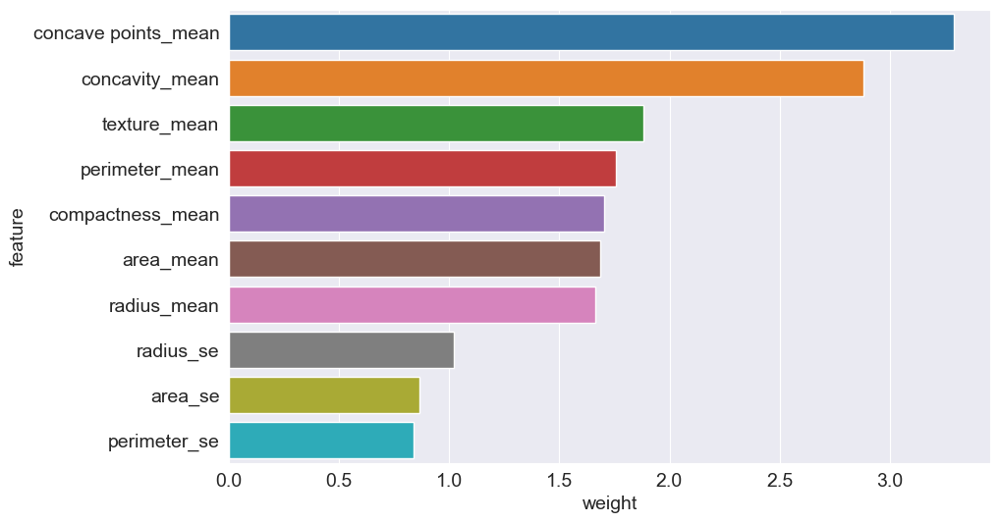

In [127]:
weight_df = pd.DataFrame({
    'feature': numeric_cols,
    'weight': model.coef_.tolist()[0]
})

sns.barplot(data=weight_df.sort_values('weight', ascending=False).head(10), x='weight', y='feature')

These are the features that have the highest weights within out prediction model.

Each weight is applied to the value in a specific column of the input. Higher the weight, greater the impact of the column on the prediction.

## Evaluation of the model

We can now use the trained model to make predictions on the training test.

In [128]:
X_train = train_inputs[numeric_cols]
X_val = val_inputs[numeric_cols]
X_test = test_inputs[numeric_cols]

In [149]:
# Create predictions on training inputs
train_preds = model.predict(X_train)

In [150]:
# Create probabilistic prediction 
train_probs = model.predict_proba(X_train)

We should now test the accuracy of our model by finding the percentage of values that match between the train_preds and train_targets columns

In [148]:
# Find accuracy score
accuracy_score(train_targets, train_preds)

0.9266862170087976

The model achieves an accuracy of 92.7% on our training set. We should create a confusion matrix to determine correctly and incorrectly classified inputs.

In [139]:
# Create confusion matrix
confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.98611111, 0.01388889],
       [0.176     , 0.824     ]])

We can create a function that helps create predictions, finds the accuracy score of our predictions, and creates a confusion matrix that visually displays the prediction.

In [141]:
# Create a function that predicts and plots the inputs and targets
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 92.67%


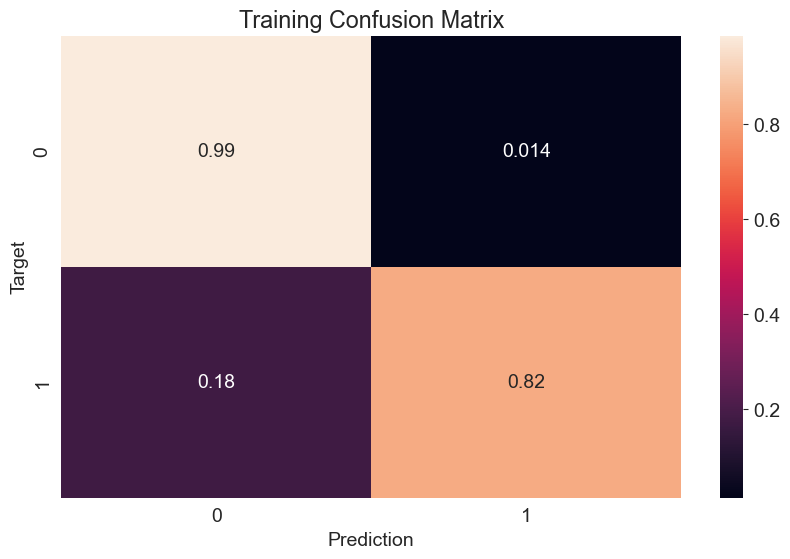

In [142]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

We can also find the model's accuracy on the validation set

Accuracy: 92.98%


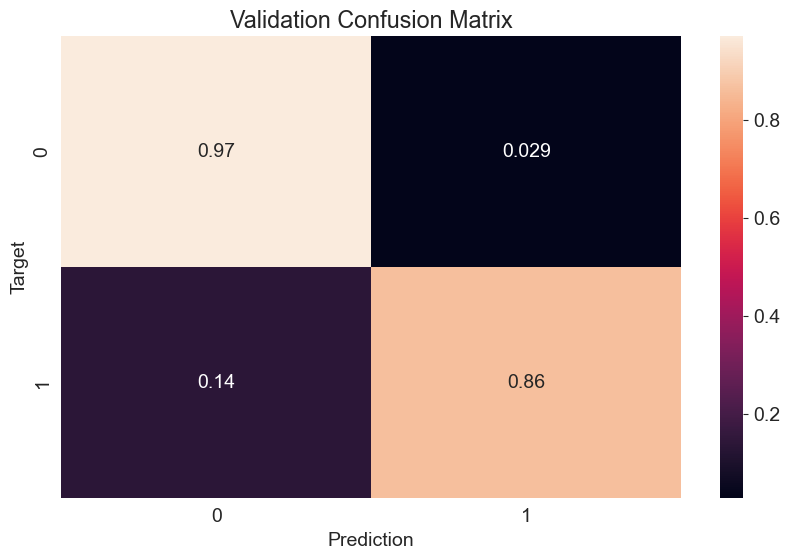

In [145]:
# Use validation set
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Find accuracy of model for testing set

Accuracy: 95.61%


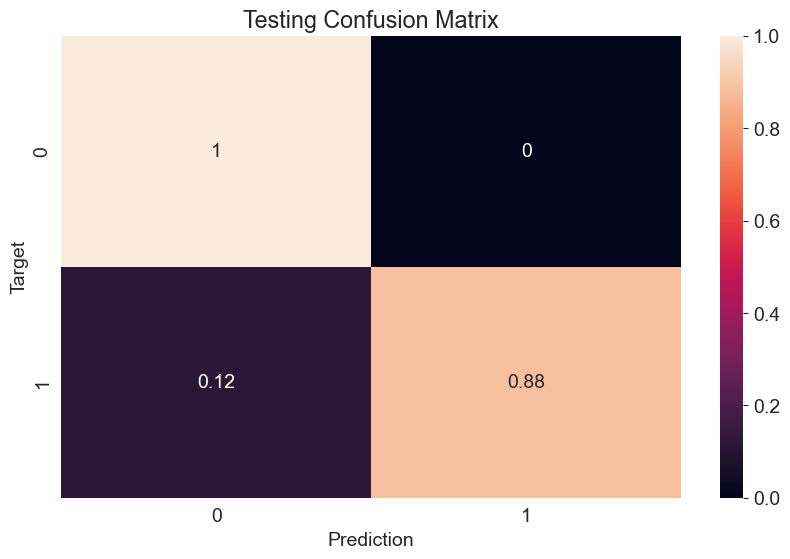

In [146]:
# Use testing set
test_preds = predict_and_plot(X_test, test_targets, 'Testing')

The accuracy of the model on the validation set is above 92%, and the accuracy of the testing set is above 95%! This suggests that our model can create predictions fairly well based off of data it hasn't seen before!

## Conclusion

After cleaning, analyzing, creating training sets, and evaluating the model, we can now summarize our findings.

#### Correlating features

I predicted that the radius, perimeter, area, compactness, and concavity would contribute the most to the final diagnosis. After creating a bar chart displaying which features had the highest weights, we can see that all of these features were in the top 10 largest weights.

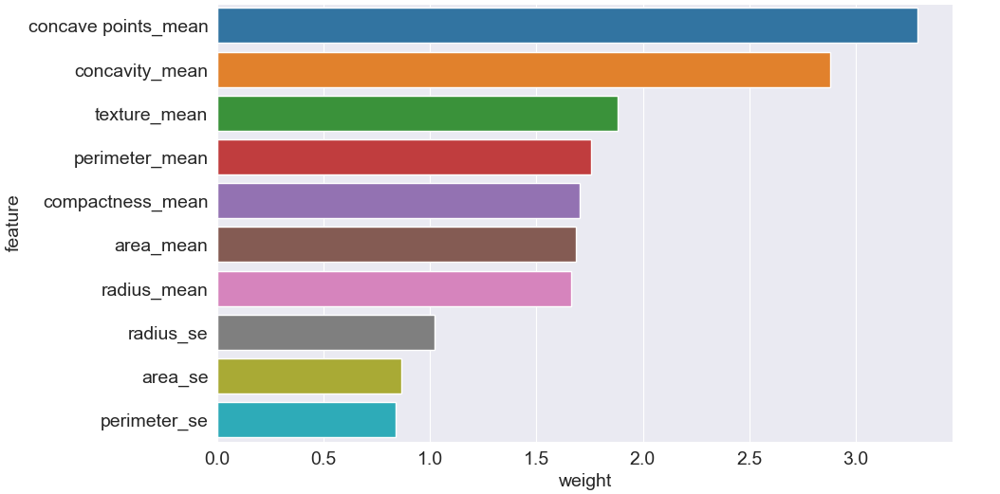

This chart displays the largest weights that contribute the most in determining final diagnoses. 

#### Model Evaluation

After separating the data into training, validation, and testing sets, we created a logistic regression model that could predict whether a tumor was either benign or cancerous. 

#### Training Model

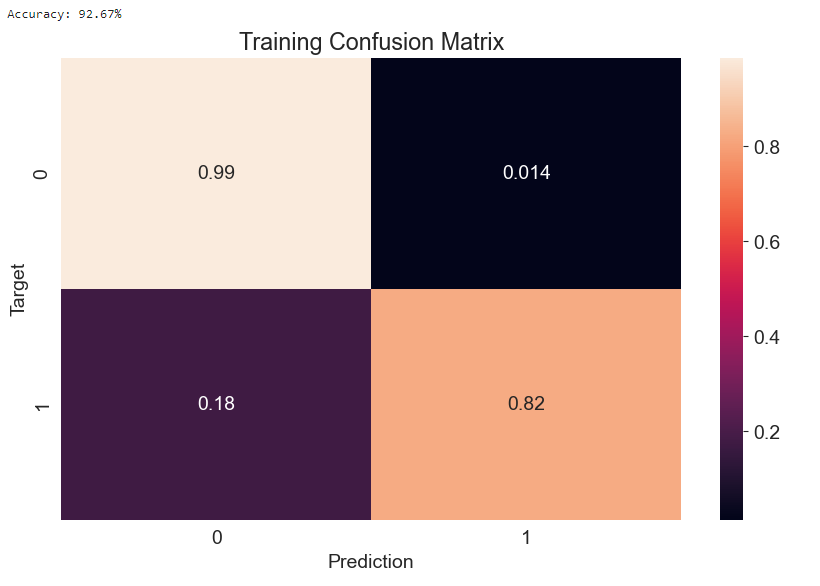

The training model provided a 92.67% accuracy

- True negative: 99%, target and prediction were both benign
- False negative: 18%, target was malignant, prediction was benign
- True positive: 82%, target and prediction were both malignant
- False positive: 1.4%, target was benign, and prediction was malignant
  
<br>

#### Validation Model

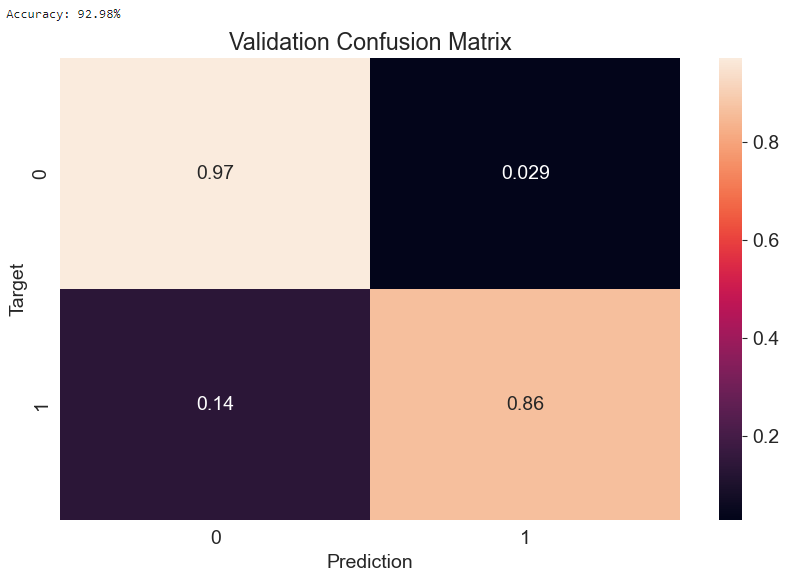

The validation model provided a 92.98% accuracy

The model predicts:

- True negative: 97%, target and prediction were both benign
- False negative: 14%, target was malignant, prediction was benign
- True positive: 86%, target and prediction were both malignant
- False positive: 2.9%, target was benign, and prediction was malignant

<br>

#### Testing model

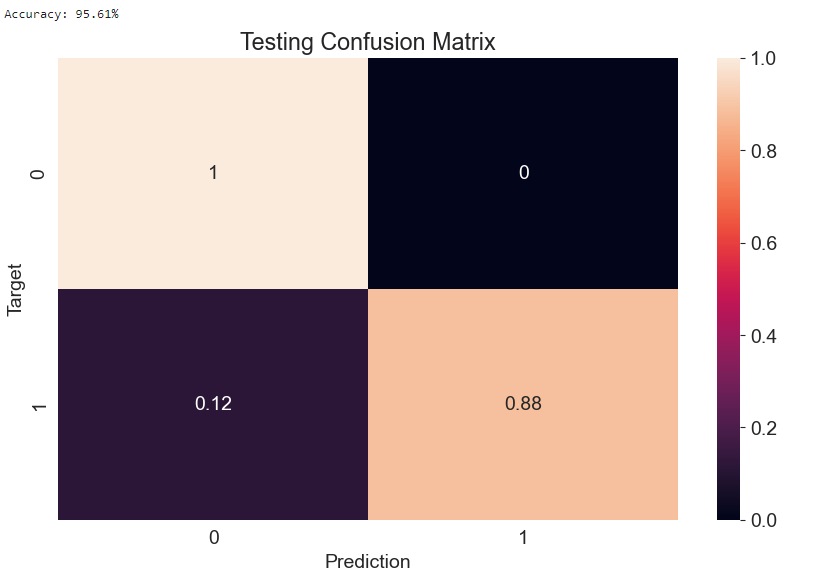

<br>

The model predicts:

- True negative: 100%, target and prediction were both benign
- False negative: 12%, target was malignant, prediction was benign
- True positive: 88%, target and prediction were both malignant
- False positive: 0%, target was benign, and prediction was malignant

<br>

We see as each model is used on each set, the accuracy of the model improves progressively. First from 92.67% on the training set, to 92.98% on the validation set, and finally to 95.61% for the testing set. We can now suggest that the final model can make predictions based off of data it has not seen yet!